# Vehicle Detection Project

In [1]:
import os 
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import time
from collections import deque
from scipy.ndimage.measurements import label
from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
%matplotlib inline

In [2]:
# Locates vehicle images
basedir = 'vehicles/'

# Stores car images in list
image_types = os.listdir(basedir)
cars = []
for imtype in image_types:
    cars.extend(glob.glob(basedir + imtype + '/*'))
    
print ('Number of Vehicle Images found: ', len(cars))
with open('cars.txt', 'w') as f:
    for fn in cars:
          f.write(fn + '\n')

# Locates non-vehicle images
basedir = 'non-vehicles/'

# Stores non-vehicle images in list
image_types = os.listdir(basedir)
notcars = []
for imtype in image_types:
    notcars.extend(glob.glob(basedir + imtype + '/*'))
    
print('Number of Non-Vehicle Images found: ', len(notcars))
with open('notcars.txt', 'w') as f:
    for fn in notcars:
          f.write(fn + '\n')

Number of Vehicle Images found:  8792
Number of Non-Vehicle Images found:  8968


In [3]:
# Computes HOG features
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False):
    if vis == True:
        features, hog_image = hog(  img,
                                    orientations=orient, 
                                    pixels_per_cell=(pix_per_cell, pix_per_cell),
                                    cells_per_block=(cell_per_block, cell_per_block),
                                    transform_sqrt = False,
                                    visualise=vis,
                                    feature_vector=feature_vec
                                    )
        return features, hog_image
    else:      
        features = hog( img,
                        orientations = orient, 
                        pixels_per_cell = (pix_per_cell, pix_per_cell),
                        cells_per_block = (cell_per_block, cell_per_block),
                        transform_sqrt = False,
                        visualise = vis,
                        feature_vector = feature_vec
                        )
        return features

# Computs spatial features
def bin_spatial(img, size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))

# Computes color histogram features  
def color_hist(img, nbins=32):
    # Computes the histogram for each color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins) 
    channel2_hist = np.histogram(img[:,:,1], bins=nbins) 
    channel3_hist = np.histogram(img[:,:,2], bins=nbins) 
    
    # Concatenates histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    return hist_features

# Extracts features from a list of images
def extract_features(imgs, 
                     color_space = 'RGB', 
                     spatial_size = (32, 32), 
                     hist_bins = 32, 
                     orient = 9, 
                     pix_per_cell = 8, 
                     cell_per_block = 2, 
                     hog_channel = 0, 
                     spatial_feat = True, 
                     hist_feat = True,
                     hog_feat = True
                     ):
    # Creats feature vectors template
    features = []
    
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        image = mpimg.imread(file)
        
        # Applies color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)  
        
        # Extracts spatial features
        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        
        # Extracts color histogram features
        if hist_feat == True:
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        
        # Extracts HOG features
        if hog_feat == True:
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                                        orient, 
                                                        pix_per_cell, 
                                                        cell_per_block, 
                                                        vis=False, 
                                                        feature_vec=True)
                                                       )
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], 
                                                orient, 
                                                pix_per_cell, 
                                                cell_per_block, 
                                                vis=False, 
                                                feature_vec=True
                                               )
            # Appends the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
        
    # Returne list of feature vectores
    return features

In [4]:
# Creats a sliding window in area of intrest
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    
    # Sets x and/or y start/stop to image size if positions not defined
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
        
    # Computes the span of the area of intrest   
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    
    # Computes the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    
    # Computes the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) - 1
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) - 1
    
    # Initializes window list
    window_list = []
    
    # Loops through finding x and y window positions
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Appends window position to list
            window_list.append(((startx, starty), (endx, endy)))
            
    return window_list

In [5]:
# Defines bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    
    # Creats output template
    imcopy = np.copy(img)
    
    # Iterates through the bounding boxes
    for bbox in bboxes:
        # Draws a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
        
    return imcopy

In [6]:
# Extract features from a single search window
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True, vis = False):    
    
    # Initializes output list for image features
    img_features = []
    
    # Applies color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
        
    # Computed spatial features
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        # Appends features to list
        img_features.append(spatial_features)
        
    # Computes histogram features
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        # Appends features to list
        img_features.append(hist_features)
        
    # Computes HOG features
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            if vis == True:
                hog_features, hog_image = get_hog_features(feature_image[:,:,hog_channel], orient,
                                        pix_per_cell, cell_per_block, vis=True, feature_vec=True)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            
        # Appends features to list
        img_features.append(hog_features)

    # Returns concatenated array of features
    if vis == True:
        return np.concatenate(img_features), hog_image
    else:
        return np.concatenate(img_features)

In [7]:
# Creats list of search windows
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    # Creates an empty list for positive detection windows
    on_windows = []
    
    # Iterates over all windows
    for window in windows:
        # Extracts the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        
        # Extracts features for that window
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        
        # Scales extracted features
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        
        # Predicts using classifier
        prediction = clf.predict(test_features)
        
        # Save the window when prediction positive
        if prediction == 1:
            on_windows.append(window)
            
    return on_windows

In [8]:
# Plots multiple images
def visualize (fig, rows, cols, imgs, titles):
    for i, img in enumerate (imgs):
        plt.subplot(rows, cols, i+1)
        plt. title(i+1)
        img_dims = len(img.shape)
        if img_dims < 3:
            plt.imshow(img, cmap='hot')
            plt.title(titles[i])
        else:
            plt.imshow(img)
            plt.title(titles[i])

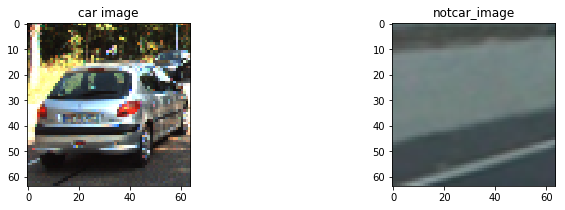

In [9]:
# Plots random example images

# Chooses random car / non-car indices
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))

# Reads in sample images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])

# Visualizes original and hog images
images = [car_image, notcar_image]
titles = ['car image', 'notcar_image']
fig = plt.figure(figsize=(12,3))
visualize(fig, 1, 2, images, titles)

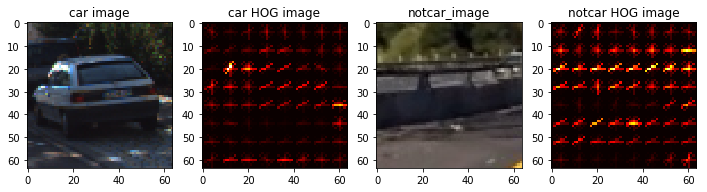

In [10]:
# Creats HOG images

# Chooses random car / non-car indices
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))

# Reads in sample images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])

# Sets filter parameters
color_space = 'RGB' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb # HLS
orient = 6  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 0 # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions # (32,32)
hist_bins = 16    # Number of histogram bins # 32
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

# Extracts HOG feature
car_features, car_hog_image = single_img_features(car_image, color_space=color_space, 
                        spatial_size=spatial_size,
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat, vis = True
                                                 )
notcar_features, notcar_hog_image = single_img_features(notcar_image, color_space=color_space, 
                        spatial_size=spatial_size,
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat, vis = True
                                                       )
# Visualizes original and hog images
images = [car_image, car_hog_image, notcar_image, notcar_hog_image]
titles = ['car image', 'car HOG image', 'notcar_image', 'notcar HOG image']
fig = plt.figure(figsize=(12,3))
visualize(fig, 1, 4, images, titles)

In [11]:
# Classifier Car/Non-Car

# Defines parameters
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb # HLS
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions # (32,32)
hist_bins = 64 # Number of histogram bins # 32
spatial_feat = True # Spatial features on or off
hist_feat = False # Histogram features on or off
hog_feat = True # HOG features on or off

t=time.time()

# Creats subsample of images 
#n_samples = 1000
#random_idxs = car np.random.randint(0, len(cars), n_samples)

test_cars = cars #np.array(cars)[random_idxs]
test_notcars = notcars # np.array(notcars)[random_idxs]

# Extracts features
car_features = extract_features(test_cars, 
                                color_space = color_space, 
                                spatial_size = spatial_size,
                                hist_bins = hist_bins,
                                orient = orient,
                                pix_per_cell = pix_per_cell, 
                                cell_per_block = cell_per_block, 
                                hog_channel = hog_channel, 
                                spatial_feat = spatial_feat, 
                                hist_feat = hist_feat, 
                                hog_feat = hog_feat, 
                               )
notcar_features = extract_features(test_notcars, 
                                color_space = color_space, 
                                spatial_size = spatial_size,
                                hist_bins = hist_bins,
                                orient = orient,
                                pix_per_cell = pix_per_cell, 
                                cell_per_block = cell_per_block, 
                                hog_channel = hog_channel, 
                                spatial_feat = spatial_feat, 
                                hist_feat = hist_feat, 
                                hog_feat = hog_feat, 
                               )
print(time.time()-t, 'Seconds to compute features... ')

# Creates an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fits a per-column scaler
X_scaler = StandardScaler().fit(X)
# Applies the scaler to X
scaled_X = X_scaler.transform(X)

# Creates labels vector
lables = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Splits data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, 
                                                    lables, 
                                                    test_size = 0.1, 
                                                    random_state = rand_state
                                                   )

# Outputs feature info
print('Using:', 
      orient,'orientations',
      pix_per_cell, 'pixels per cell and',
      cell_per_block,'cells per block', 
      hist_bins, 'histogram bins, and ', 
      spatial_size, 'spatial sampling'
     )
print('Feature vector length: ', len(X_train[0]))

# Applies linear SVC with grid search for C
clf = GridSearchCV(LinearSVC(C=1), [{'C': [0.1, 0.3, 1, 3]}])

# Checks the training time for the classifier
t=time.time()
clf.fit(X_train, y_train)
print(round(time.time()-t, 2), 'Seconds to train SVC...')

# Checks the score of the classifier
print('Test Accuracy of SVC = ', round(clf.score(X_test, y_test), 4))
print('Gridsearch results \n', clf.best_params_)

82.24063992500305 Seconds to compute features... 
Using: 9 orientations 8 pixels per cell and 2 cells per block 64 histogram bins, and  (16, 16) spatial sampling
Feature vector length:  6060
220.09 Seconds to train SVC...
Test Accuracy of SVC =  0.991
Gridsearch results 
 {'C': 0.1}


1.9870119094848633 seconds to process one image searching  438 windows
1.9044320583343506 seconds to process one image searching  438 windows
1.8967108726501465 seconds to process one image searching  438 windows
2.0993800163269043 seconds to process one image searching  438 windows
1.9418950080871582 seconds to process one image searching  438 windows
1.9115259647369385 seconds to process one image searching  438 windows


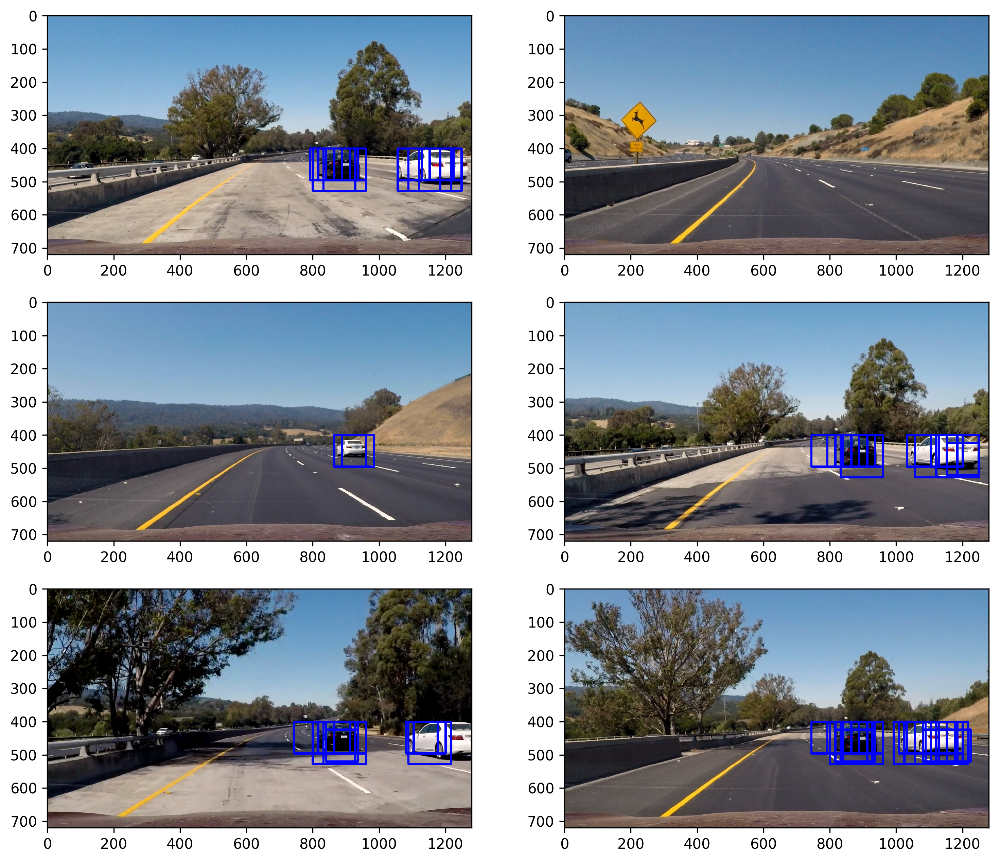

In [12]:
# Car detection with sliding window search

# Imports test images
searchpath = 'test_images/test*.jpg'
example_images = glob.glob(searchpath)

# Creats output templates
images = []
titles = []

# Defines area of intrest
y_start_stop = [400, 656] # Min and max in y to search in slide_window()

# Defines sliding window overlap
overlap = 0.75

windows = []

# Iterates over test images
for img_src in example_images:
    
    t1 = time.time()
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    hot_list = []
    windows_count = 0
    for scale in [(96, 96), (128, 128)]:
        
        # Applies sliding search window 
        windows = slide_window( img, 
                                x_start_stop = [None, None], 
                                y_start_stop = y_start_stop,
                                xy_window = scale, 
                                xy_overlap = (overlap, overlap)
                              )
        windows_count = windows_count + len(windows)

        # Applies classifier
        hot_windows = search_windows(img, windows, clf, X_scaler, 
                                     color_space = color_space, 
                                     spatial_size = spatial_size, 
                                     hist_bins = hist_bins, 
                                     orient = orient, 
                                     pix_per_cell = pix_per_cell, 
                                     cell_per_block = cell_per_block, 
                                     hog_channel = hog_channel, 
                                     spatial_feat = spatial_feat, 
                                     hist_feat = hist_feat, 
                                     hog_feat = hog_feat
                                    )
        hot_list = hot_list + hot_windows
        
    # Draws boxes
    window_img = draw_boxes(draw_img, 
                           hot_list, 
                           color = (0, 0, 255), 
                           thick = 6 
                           )
    images.append(window_img)
    titles.append('')
    print(time.time() - t1, 'seconds to process one image searching ', windows_count, 'windows')

# Visualizes image with boxes
fig = plt.figure(figsize = (12, 18), dpi = 300)
visualize(fig, 5, 2, images, titles)

In [13]:
# Converts the image to the specified color space
def convert_color(img, conv = 'RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

0.8784921169281006 seconds to run, total windows =  912
0.5754189491271973 seconds to run, total windows =  912
0.5275928974151611 seconds to run, total windows =  912
0.5049519538879395 seconds to run, total windows =  912
0.594581127166748 seconds to run, total windows =  912
0.4957139492034912 seconds to run, total windows =  912


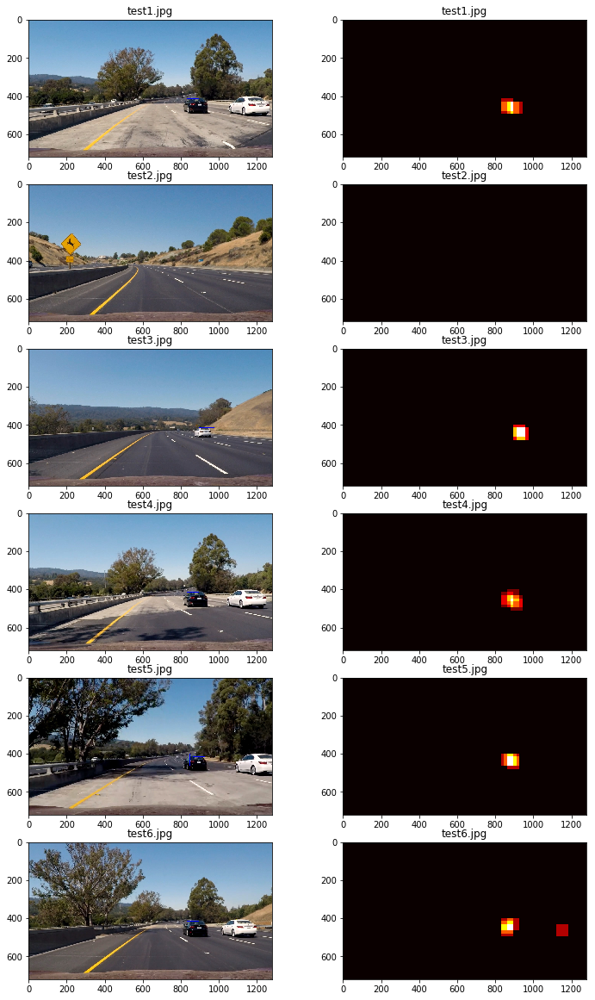

In [14]:
# Car detection with heat map

# Creats empty output templates
out_images = []
out_maps = []
out_titles = []
out_boxes = []

# Condifinds the area of intrest in y direction
ystart = 400
ystop = 656
scale = 1

# Iterates over the test images
for img_src in example_images:
    img_boxes = []
    t = time.time()
    count = 0
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    
    # Makes a heat map template
    heatmap = np.zeros_like(img[:,:,0])
    # Scales jpeg images from 0-255 to 0-1
    img = img.astype(np.float32)/255
    
    # Crops image to area of intrest
    img_tosearch = img[ystart:ystop, :, :]
    
    # Applies the specified color channel transformation
    ctrans_tosearch = convert_color(img_tosearch, conv = 'RGB2YCrCb')
    
    # Scales the area of interest
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
    
    # Splits color channels
    ch1 = ctrans_tosearch[:, :, 0]
    ch2 = ctrans_tosearch[:, :, 1]
    ch3 = ctrans_tosearch[:, :, 2]
    
    # Defines blocks and steps
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    nfeat_per_block = orient * cell_per_block ** 2
    
    window = 64
    nblocks_per_window = (window // pix_per_cell) - 1
    
    cells_per_step = 2 #Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Computes the HOG features for each channel
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec = False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec = False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec = False)
    
    # Iterates over the cells
    for xb in range(nxsteps):
        for yb in range(nysteps):
            count += 1
            ypos = yb * cells_per_step
            xpos = xb * cells_per_step
            
            # Extracts the HOG features 
            hog_feat1 = hog1[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel()
            hog_feat2 = hog2[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel()
            hog_feat3 = hog3[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel()
            hog_features = np.hstack((hog_feat1,hog_feat2, hog_feat3))
            
            xleft = xpos * pix_per_cell
            ytop = ypos * pix_per_cell
            
            # Extracts the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop + window, xleft:xleft + window], (64,64))
            
            # Gets color features
            spatial_features = bin_spatial(subimg, size = spatial_size)
            
            # Scales features
            test_features = X_scaler.transform(np.hstack((spatial_features, hog_features)).reshape(1, -1))
            
            # Makes predictions
            test_prediction = clf.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft * scale)
                ytop_draw = np.int(ytop * scale)
                win_draw = np.int(window * scale)
                
                cv2.rectangle(draw_img, 
                              (xbox_left, ytop_draw + ystart), 
                              (xbox_left + win_draw, ytop_draw + win_draw + ystart), 
                              (0,0,255)
                             )
                img_boxes.append(((xbox_left, ytop_draw + ystart), 
                                (xbox_left + win_draw, ytop_draw + win_draw + ystart)
                                ))
                heatmap[ytop_draw + ystart : ytop_draw + win_draw + ystart,
                       xbox_left : xbox_left + win_draw
                       ] += 1
    print(time.time()-t, 'seconds to run, total windows = ', count)

    # Creats output lists
    out_images.append(draw_img)

    out_titles.append(img_src[-9:])
    out_titles.append(img_src[-9:])

    out_images.append(heatmap)
    out_maps.append(heatmap)
    out_boxes.append(img_boxes)

# Visualizes output
fig = plt.figure(figsize = (12, 24))
visualize(fig, 7, 2, out_images, out_titles)

In [15]:
# Functionn for video pipeline
def find_cars(img, scale):
    
    draw_img = np.copy(img)
    
    # Makes a heat map template
    heat_map = np.zeros_like(img[:,:,0])
    
    # Scales jpeg images from 0-255 to 0-1
    img = img.astype(np.float32)/255
    
    # Crops image to area of intrest
    img_tosearch = img[ystart:ystop, :, :]
    
    # Applies the specified color channel transformation
    ctrans_tosearch = convert_color(img_tosearch, conv = 'RGB2YCrCb')
    
    # Scales the area of interest
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
    
    # Splits color channels
    ch1 = ctrans_tosearch[:, :, 0]
    ch2 = ctrans_tosearch[:, :, 1]
    ch3 = ctrans_tosearch[:, :, 2]
    
    # Defines blocks and steps
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    nfeat_per_block = orient * cell_per_block ** 2
    
    window = 64
    nblocks_per_window = (window // pix_per_cell) - 1
    
    cells_per_step = 2 #Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Computes the HOG features for each channel
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec = False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec = False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec = False)
    
    # Iterates over the cells
    for xb in range(nxsteps):
        for yb in range(nysteps):

            ypos = yb * cells_per_step
            xpos = xb * cells_per_step
            
            # Extracts the HOG features 
            hog_feat1 = hog1[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel()
            hog_feat2 = hog2[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel()
            hog_feat3 = hog3[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel()
            hog_features = np.hstack((hog_feat1,hog_feat2, hog_feat3))
            
            xleft = xpos * pix_per_cell
            ytop = ypos * pix_per_cell
            
            # Extracts the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop + window, xleft:xleft + window], (64,64))
            
            # Gets color features
            spatial_features = bin_spatial(subimg, size = spatial_size)
            hist_features = color_hist(subimg, nbins = hist_bins)
            
            # Scales features
            test_features = X_scaler.transform(np.hstack((spatial_features, hog_features)).reshape(1, -1))
            
            # Makes predictions
            test_prediction = clf.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft * scale)
                ytop_draw = np.int(ytop * scale)
                win_draw = np.int(window * scale)
                
                cv2.rectangle(draw_img, 
                              (xbox_left, ytop_draw + ystart), 
                              (xbox_left + win_draw, ytop_draw + win_draw + ystart), 
                              (0,0,255)
                             )
                img_boxes.append(((xbox_left, ytop_draw + ystart), 
                                (xbox_left + win_draw, ytop_draw + win_draw + ystart)
                                ))
                heat_map[ytop_draw + ystart : ytop_draw + win_draw + ystart,
                       xbox_left : xbox_left + win_draw] += 1
    
    return draw_img, heat_map

In [16]:
# Applies threshold to a heat map
def apply_threshold(heat_map, threshold):
    
    # Zero outpixels below the threshold
    heat_map [heat_map <= threshold] = 0
    
    # Return threshold map
    return heat_map

# Draws boxes
def draw_labeled_bboxes(img, labels):
    # Iterates through all detected cars
    for car_number in range(1, labels[1] + 1):
        # Finds pixels with each car_number label value
        nonzero = (labels [0] == car_number).nonzero()
        # Identifies x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array (nonzero[1])

        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Returns the image
    return img
    

In [17]:
# Processes video image
def process_image(img):
    
    # Sets parameters
    scales = [0.8, 1.0, 1.5, 2.0]
    threshold = 4
    deque_len = 5
    
    # Creats a heat map que
    heat_map_deque = deque(maxlen = deque_len * len(scales))
    
    for scale in scales:
        out_img, heat_map = find_cars(img, scale)  
        heat_map_deque.append(heat_map)
    
    sum_heat_map = sum((heat_map_deque), 0)
    
    thresholded_heat_map = apply_threshold(sum_heat_map, threshold = threshold)
    
    labels = label(thresholded_heat_map)
    
    # Draw bounding boxes on an copy of the image
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img

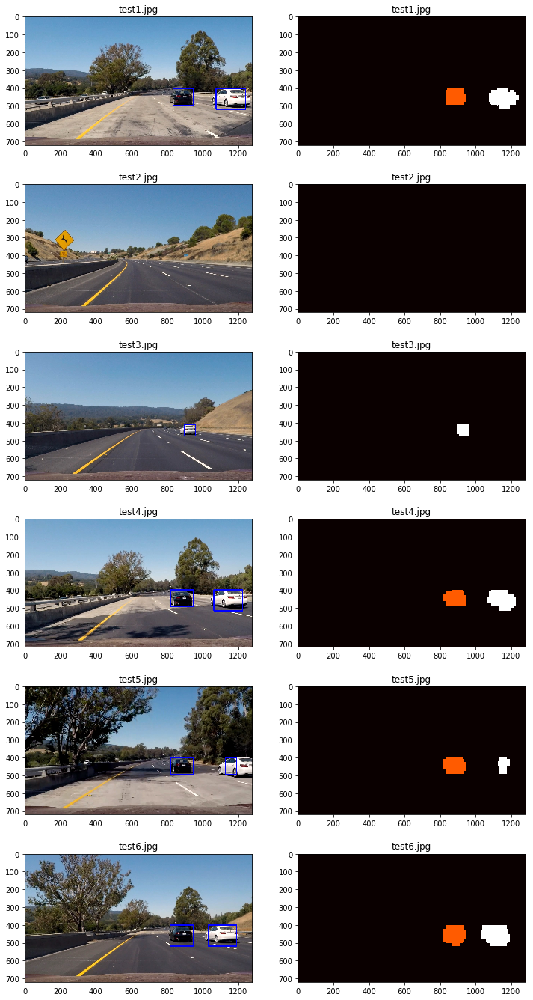

In [18]:
# Visualizes lable maps for parameter optimazation

# Creats empty output templates
out_images = []

# Iterates over test images
for img_src in example_images:
    img = mpimg.imread(img_src)
                        

    scales = [0.8, 1.0, 1.5, 2.0]
    threshold = 4
    deque_len = 5
    
    # Creats a heat map que
    heat_map_deque = deque(maxlen = deque_len * len(scales))
    
    for scale in scales:
        out_img, heat_map = find_cars(img, scale)  
        heat_map_deque.append(heat_map)
    
    sum_heat_map = sum((heat_map_deque), 0)
    
    thresholded_heat_map = apply_threshold(sum_heat_map, threshold = threshold)
    
    labels = label(thresholded_heat_map)
    
    # Draw boundig boxes on a copy pf the image
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    out_images.append(draw_img)
    out_images.append(labels[0])
    
fig = plt.figure(figsize = (12, 24))
visualize(fig, 6, 2, out_images, out_titles)

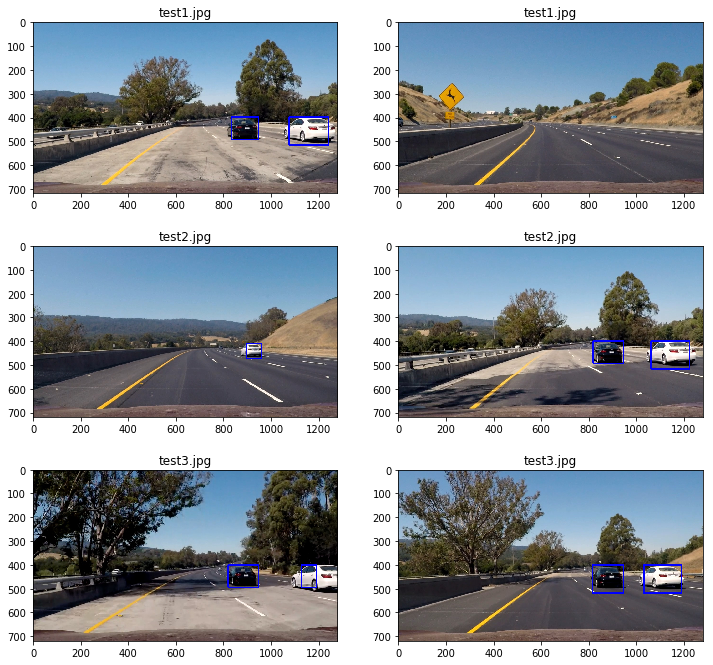

In [19]:
# Visualizes output bboxes on test images

# Creats empty output templates
out_images = []

# Iterates over test images
for img_src in example_images:
    img = mpimg.imread(img_src)
    
    draw_img = process_image(img)
    out_images.append(draw_img)

fig = plt.figure(figsize = (12, 24))
visualize(fig, 6, 2, out_images, out_titles)

In [20]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

test_output = 'output_video.mp4'
clip = VideoFileClip('project_video.mp4')#.subclip(30, 40)
#clip = VideoFileClip('test_video.mp4')
test_clip = clip.fl_image(process_image)

test_clip.write_videofile(test_output, audio = False)

[MoviePy] >>>> Building video output_video.mp4
[MoviePy] Writing video output_video.mp4


100%|█████████▉| 1260/1261 [1:50:48<00:03,  3.28s/it]    


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_video.mp4 



In [21]:
HTML("""
<video width="960" height = "540" controls>
    <source src="{0}">
</video>
""".format(test_output))